<a href="https://colab.research.google.com/github/sysbio-unam/GAFerm/blob/main/Copy_of_Intro_Opt_ML_STUDENTS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Authors:
## Antonio del Rio Chanona      https://www.imperial.ac.uk/people/a.del-rio-chanona
## Edgar Ivan Sanchez Medina    https://www.mpi-magdeburg.mpg.de/person/103552/2316

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

Along this notebook you will find <font color='blue'>text in blue that describe the **coding tasks** that you have to implement.</font> Within the code cell, your implementation needs to be between the line:

`#-#-#-#-#-#-#-#-#-# Start of your code #-#-#-#-#-#-#-#-#-#`

and the line:

`#-#-#-#-#-#-#-#-#-# End of your code #-#-#-#-#-#-#-#-#-#-#`

# **1. Optimization basics**

An optimization problem has the form

\begin{equation}
\begin{aligned}
\min_{x \in X} \quad & f(x)\\
\textrm{s.t.} \quad & g_i(x) \leq 0, i= 1, ..., m\\
\end{aligned}
\end{equation}

The vector $x = (x_1,..., x_n)$ is the optimization variable of the problem, the function $f : \mathbb{R}^n \to \mathbb{R} $ is the objective function, the functions $g_i : \mathbb{R}^n \to \mathbb{R} $,
$i = 1, ...,m$, are the (inequality) constraint functions. A vector $x^⋆$ is called optimal, if it has the smallest objective value among all vectors
that satisfy the constraints.

**Convex optimization**

A convex optimization problem is one in which the objective and the
constraint functions are convex, which means they satisfy the inequality:

\begin{equation}
f(\alpha x + \beta y) \leq \alpha f(x) + \beta f(y)
\end{equation}

for all $x,y \in \mathbb{R}^n$ and all $\alpha, \beta \in \mathbb{R}$ with $\alpha + \beta = 1$, $\alpha  \geq 0$ and $\beta  \geq 0$

It is worth nothing that any equality constraint can be represented as two inequality constraints. This enforce that, in a convex problem, the equality constraints must be linear.

Therefore, an optimization problem is convex whenever the following requirements are met:

* The objective function is convex.
* The inequality constraints are convex.
* The equality constraints are linear.

**Global and local optima**

An optimal solution $x^*$ is said to be the global optimum when the constraints are met at this point and $f(x^*) \leq f(x),  \forall x \in X$. When this condition is met only whitin a certain neightborhood, the solution is called local optimum.




# **2. Gradient descent**

The optimization methods known as "descent methods" minimize a function by applying the following update rule at each iteration:   

\begin{equation}
x^{(k+1)} = x^{(k)} +  \alpha^{(k)} \Delta x^{(k)}
\end{equation}

in this rule, $\Delta^{(k)}$ denotes the **direction** at the iteration $k$, and $\alpha^{(k)} \geq 0$ is a scalar value called **step size**. These methods are called descent methods, because at each iteration $f \left(x^{(k+1)} \right) \leq  f \left(x^{(k)} \right)$.

In the method called *Gradient Descent* the direction is chosen to be the negative of the gradient: $ \Delta x := - \nabla f(x) $. therefore, the algorithm is:

**Algorithm**

1. Given a starting point $x \in X$.
2. Repeat
3. $~~~~~~$ $ \Delta x := - \nabla f(x) $
2. $~~~~~~$ Choose $\alpha$.
3. $~~~~~~$ Update: $ x = x +  \alpha \Delta x$
4. until stopping criterion is met.

<font color='blue'>Code step 3 and 5 within the following code.</font>


In [11]:
############################
# --- Gradient Descent --- #
############################

def gradient_descent(f, x0, grad_f, lr, max_iter=1e5, grad_tol=1e-4, traj=False):
    '''
    Gradient Descent
    INPUTS:
        f        : Function
        x0       : Initial guess
        grad_f   : Gradient function
        lr       : Learning rate
        max_iter : Maximum number of iterations
        grad_tol : Tolerance for gradient approximation
        plot     : Boolean for plotting
    OUTPUTS:
        x        : Optimal point
        iter_i   : Number of iterations needed
    '''
    
    # initialize problem
    x      = np.copy(x0) # por qué una copia? 
    iter_i = 0
    grad_i = grad_tol*10
    
    # plotting
    if traj == True:
        x_list = []
        f_list = []            
    
    # optimization loop
    while np.sum(np.abs(grad_i)) > grad_tol and iter_i < max_iter:    
        
        #-#-#-#-#-#-#-#-#-# Start of your code #-#-#-#-#-#-#-#-#-#
        grad_i  = grad_f(f,x)     # compute gradient
        x       = x - lr * grad_i     # compute step    
        #-#-#-#-#-#-#-#-#-# End of your code #-#-#-#-#-#-#-#-#-#

        iter_i += 1
        
        # plotting
        if traj == True:
            x_list.append(x.flatten().tolist())
            f_list.append(f(x))
        
    print(' Optimization using Gradient Descent \n')
    print('Iterations: ', iter_i)
    print('Optimal x : ', x) 
    print('Final grad: ', grad_i)
    
    # trajectory    
    if traj == True:
        return x, x_list, f_list, 
        
    return x, iter_i

One way to approximate the (numerically) gradient of a function  is the **finite diffirences method**. There exist mainly three type of finite difference approximations:

* Backward difference  $f'(x) \approx \frac{f(x_k) - f(x_k - \epsilon)}{\epsilon}$
* Forward difference  $f'(x) \approx \frac{f(x_k + \epsilon) + f(x_k)}{\epsilon}$
* Central difference $f'(x) \approx \frac{f(x_k + \frac{\epsilon}{2}) - f(x_k - \frac{\epsilon}{2})}{\epsilon}$

However, the central difference approximation gives the most accurate one among these three. Therefore, let's implement that one here.

<font color='blue'>Implement the **central finite differences**.</font>

In [12]:
######################################    
# --- Central finite differences --- #
######################################

def central_finite_diff(f, x):
      '''
      Central finite differences approximation.
      INPUTS:
          f  : Function
          x  : Position where to approximate the gradient
      OUTPUTS:
          grad: Approximation of the gradient of f at x 
      '''
      dim = x.shape[0]
      eps  = np.sqrt(np.finfo(float).eps)  # Step-size is the square root of the machine precision
      grad = np.zeros((1,dim))
      
      #-#-#-#-#-#-#-#-#-# Start of your code #-#-#-#-#-#-#-#-#-#
      for i in range(dim):
          e           = np.zeros((1,dim)) # no debería de ir afuera?
          e[0,i]        = eps
          grad_approx = (f(x + e/2) - f(x - e/2))/eps # para qué usar e si puedes usar eps, como en el denominador
          grad[0,i]     = grad_approx
      
      #-#-#-#-#-#-#-#-#-# End of your code #-#-#-#-#-#-#-#-#-#-#
      return grad

The next cell contains the test function that we are going to use here, but this can be replace by any function. In order to approximate the gradients we are going to use the central finite differences method with five-points.

In [13]:
def Rosenbrock_f(x):
    '''
    Rosenbrock function
    '''
    n = np.shape(x)[1]
    z = np.sum(100*(x[:,1:] - x[:,:n-1]**2)**2 + (x[:,:n-1] - 1)**2, axis=1)
    return z

###############################################
# --- Central finite differences 5 points --- # 
###############################################

def central_finite_diff5(f, x):
      '''
      Five-points method for central finite differences.
      INPUTS:
          f  : Function
          x  : Position where to approximate the gradient
      OUTPUTS:
          grad: Approximation of the gradient of f at x 
      '''
      dim = x.shape[1]
      # Step-size is taken as the square root of the machine precision
      eps  = np.sqrt(np.finfo(float).eps) 
      grad = np.zeros((1,dim))
        
      for i in range(dim):
          e           = np.zeros((1,dim))
          e[0,i]      = eps
          grad_approx = (f(x - 2*e) - 8*f(x - e) + 8*f(x + e) - f(x + 2*e) )/(12*eps) 
          
          grad[0,i]     = grad_approx
        
      return grad

In [14]:
# --- Gradient Descent --- #
x0 = np.array([0.,0.]).reshape(1,-1)

xf, x_list, f_list = gradient_descent(Rosenbrock_f, x0, central_finite_diff5, 0.001, traj=True)

 Optimization using Gradient Descent 

Iterations:  20512
Optimal x :  [[0.99991668 0.99983304]]
Final grad:  [[-3.32906583e-05 -6.67089974e-05]]


In [15]:
# Plot function
x_1 = np.linspace(0,1)
x_2 = np.linspace(0,1)
X, Y = np.meshgrid(x_1, x_2)
Z = Rosenbrock_f(np.append(X.reshape(-1,1), Y.reshape(-1,1), axis=1))
Z = Z.reshape(X.shape)

x_list    = np.array(x_list).reshape(-1,x0.shape[1])

x_summary = []
f_summary = []
for i in range(x_list.shape[0]):
  if i % 100 == 0:
    x_summary.append(x_list[i])
    f_summary.append(f_list[i])
x_summary = np.array(x_summary).reshape(-1,x0.shape[1])

fig = plt.figure(figsize=(6,5))
left, bottom, width, height = 0.15, 0.1, 0.8, 0.8
ax = fig.add_axes([left, bottom, width, height]) 
contours = ax.contour(x_1, x_2, Z, colors='black', alpha=0.8)
ax.clabel(contours, inline=True, fontsize=8)
ax.set_xlabel(r'$x_1$')
ax.set_ylabel(r'$x_2$')
display_value = ax.text(0.05, 0.2, '', transform=ax.transAxes)
plt.close()

def animate(i):
    ax.plot(x_summary[:i, 0], x_summary[:i, 1], 'k.', alpha=0.6)    # Animate points
    display_value.set_text('Min = ' + str(f_summary[i]))          # Animate display value
    ax.set_title('Rosenbrock function, Iteration: ' + str(i*100))  # Animate title
    return display_value

anim = FuncAnimation(fig, animate, frames=len(f_summary), interval=100, repeat_delay=800)

HTML(anim.to_jshtml())

# **4. Gradient descent with momentum**

The idea behind this extension is to avoid most of the (unnecesary) zig-zag movements of Gradient descent by accumulating momentum along the direction towards the optimum while we iterate. 

Therefore, the update rule of Gradient Descent is modified like this:

\begin{equation}
x^{(k+1)} = x^{(k)} + v^{(k)}
\end{equation}

where $v^{(k)}$ is the velocity term defined by:

\begin{equation}
v^{(k)} = \beta v^{(k-1)} - \alpha \nabla f(x^{(k)}) 
\end{equation}

where $\beta \in [0,1]$ is the momentum hyperparameter commonly set to 0.9.

<font color='blue'>Code a function for the **velocity** term calculation and a function for the **line search** method. </font>

In [33]:
####################
# --- Momentum --- #
####################

def momentum(grad_i, v_prev, lr, beta=0.1):
    '''
    Momentum function
    INPUTS:
        grad_i  : Gradient of function at current position
        v_prev  : velocity value at the previous position
        beta    : Momentum hyperparameter
    OUTPUTS:
        v       : Velocity term
    '''
    #-#-#-#-#-#-#-#-#-# Start of your code #-#-#-#-#-#-#-#-#-#
    v = beta * v_prev - lr * grad_i # velocity term
    #-#-#-#-#-#-#-#-#-# End of your code #-#-#-#-#-#-#-#-#-#

    return v

#######################
# --- Line search --- #
#######################

def ls(grad_i, x, f):
    '''
    Line search for determining learning rate
    INPUTS:
        grad_i  : Gradient of function at current position
        x       : Current position
        f       : Objective function
    OUTPUTS:
        lr    : Optimal learning rate
        iter  : Number of iterations needed in line search
    '''
    iter = 0
    lr   = 1
    #-#-#-#-#-#-#-#-#-# Start of your code #-#-#-#-#-#-#-#-#-#
    # compute line search loop
    while f(x) > f(x - lr*grad_i) and iter < 100:
        lr  = 0.5*lr          
    #-#-#-#-#-#-#-#-#-# End of your code #-#-#-#-#-#-#-#-#-#
        iter += 1
    
    return lr, iter

#######################
# --- Line search --- #
#######################

def line_search(grad_i, x, f, A=0.1, B=0.8):
    '''
    Line search for determining learning rate
    INPUTS:
        grad_i  : Gradient of function at current position
        x       : Current position
        f       : Objective function
    OUTPUTS:
        lr    : Optimal learning rate
        iter  : Number of iterations needed in line search
    '''
    #-#-#-#-#-#-#-#-#-# Start of your code #-#-#-#-#-#-#-#-#-#
    iter = 0
    lr   = 1
    while f(x - lr*grad_i) > f(x) - A*lr*np.dot(grad_i,grad_i.T) and iter<100:
        lr  = B*lr
        iter += 1
    #-#-#-#-#-#-#-#-#-# End of your code #-#-#-#-#-#-#-#-#-#
    
    return lr, iter

In [34]:
##########################################################
# --- Gradient Descent with line search and momentum --- #
##########################################################

def GD_ls_momentum(f, x0, grad_f, beta=0.9, max_iter=1e5, grad_tol=1e-4, traj=False):
    '''
    Gradient Descent with line search and momentum
    INPUTS:
        f        : Function
        x0       : Initial guess
        grad_f   : Gradient function
        beta     : Parameter beta for the momentum calculation
        max_iter : Maximum number of iterations
        grad_tol : Tolerance for gradient approximation
        plot     : Boolean for plotting
    OUTPUTS:
        x        : Optimal point
        iter_i   : Number of iterations needed
    '''
    
    # initialize problem
    x      = np.copy(x0)
    iter_i = 0
    grad_i = grad_tol*10
    
    # plotting
    if traj == True:
        x_list = []
        f_list = []            
    
    # optimization loop
    v_prev = 0      # initialize at zero to get normal GD at first step
    while np.sum(np.abs(grad_i)) > grad_tol and iter_i < max_iter:    
        grad_i  = grad_f(f,x)                               # compute gradient
        lr      = line_search(grad_i, x, f)[0]              # compute learning rate using line search
        v       = momentum(grad_i, v_prev, lr, beta=beta)   # compute momentum
        x       = x + v                                     # compute step 
        v_prev  = v                                         # update previous momentum term   
        iter_i += 1
        
        # plotting
        if traj == True:
            x_list.append(x.flatten().tolist())
            f_list.append(f(x))
        
    print(' Optimization using Gradient Descent with momentum \n')
    print('Iterations: ', iter_i)
    print('Optimal x : ', x) 
    print('Final grad: ', grad_i)
    
    # trajectory    
    if traj == True:
        return x, x_list, f_list, 
        
    return x, iter_i

In [35]:
# --- Gradient Descent with line search and momentum --- #
x0 = np.array([0.,0.]).reshape(1,-1)

xf, x_list, f_list = GD_ls_momentum(Rosenbrock_f, x0, central_finite_diff5, beta=0.95, traj=True)

 Optimization using Gradient Descent with momentum 

Iterations:  677
Optimal x :  [[0.99995163 0.99990461]]
Final grad:  [[ 2.35786870e-05 -6.37074872e-05]]


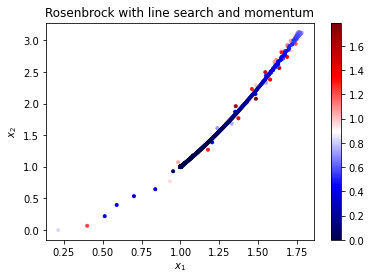

In [36]:
x_array = np.array(x_list).reshape(-1,2)
fig  = plt.figure()
cs   = plt.scatter(x_array[:,0], x_array[:,1], marker=".", c=f_list , cmap="seismic")
cbar = fig.colorbar(cs)
plt.xlabel(r'$x_1$'); plt.ylabel(r'$x_2$'); plt.title('Rosenbrock with line search and momentum')
plt.show()

# **5. Nesterov Accelerated Gradient Descent**

The Nesterov Accelerated Gradient Descent (NAG) is a further improvement to the Gradient Descent with momentum algorithm. The step direction in NAG is calculated based on the gradient on an approximated future position instead of the current position, in this way, more gradient information is included into the update step compared to the traditional momentum approach.

Therefore, the velocity term in NAG is determined by:

$v^{(k)} = \beta v^{(k-1)} - \alpha \nabla f(\tilde{x}^{(k)})$

where $\tilde{x}^{(k)}$ is the approximated future position calculated as:

$\tilde{x}^{(k)} = x^{(k)} + \beta v^{(k-1)}$

<font color='blue'>Code a function for the **nesterov** calculation of velocity. </font>

In [20]:
####################
# --- Nesterov --- #
####################

def nesterov(grad_tilde, v_prev, lr, beta=0.9):
    '''
    Momentum function
    INPUTS:
        grad_tilde  : Gradient of function at nesterov modified position
        v_prev      : velocity value at the previous position
        beta        : Momentum hyperparameter
    OUTPUTS:
        v           : Velocity term
    '''
    #-#-#-#-#-#-#-#-#-# Start of your code #-#-#-#-#-#-#-#-# 
    v = 00000  # velocity term
    #-#-#-#-#-#-#-#-#-# End of your code #-#-#-#-#-#-#-#-#-#

    return v

<font color='blue'>Implement your function **`nesterov` into the `NAG`** function bellow</font>.

In [37]:
#################################
# --- NAG with line search  --- #
#################################

def NAG(f, x0, grad_f, beta=0.9, max_iter=1e5, grad_tol=1e-4, traj=False):
    '''
    Nesterov Accelerated Gradient Descent with line search
    INPUTS:
        f        : Function
        x0       : Initial guess
        grad_f   : Gradient function
        beta     : Parameter beta for the momentum calculation
        max_iter : Maximum number of iterations
        grad_tol : Tolerance for gradient approximation
        plot     : Boolean for plotting
    OUTPUTS:
        x        : Optimal point
        iter_i   : Number of iterations needed
    '''
    
    # initialize problem
    x      = np.copy(x0)
    iter_i = 0
    grad_i = grad_tol*10
    
    # plotting
    if traj == True:
        x_list = []
        f_list = []            
    
    # optimization loop
    v_prev = 0      # initialize at zero to get normal GD-momentum at first step
    while np.sum(np.abs(grad_i)) > grad_tol and iter_i < max_iter:    
        grad_i  = grad_f(f,x)                               # compute gradient at current position
        
        #-#-#-#-#-#-#-#-#-# Start of your code #-#-#-#-#-#-#-#-# 
        x_tilde = 00000                            # nesterov modified position
        g_tilde = 00000                          # compute gradient of function at x_tilde
        lr      = line_search(g_tilde, x, f)[0]              # compute learning rate using line search
        v       = 00000   # compute momentum
        #-#-#-#-#-#-#-#-#-# End of your code #-#-#-#-#-#-#-#-# 

        x       = x + v                                     # compute step 
        v_prev  = v                                         # update previous momentum term   
        iter_i += 1
        
        # plotting
        if traj == True:
            x_list.append(x.flatten().tolist())
            f_list.append(f(x))
        
    print(' Optimization using NAG \n')
    print('Iterations: ', iter_i)
    print('Optimal x : ', x) 
    print('Final grad: ', grad_i)
    
    # trajectory    
    if traj == True:
        return x, x_list, f_list, 
        
    return x, iter_i

In [38]:
# --- NAG --- #
x0 = np.array([0.,0.]).reshape(1,-1)

xf, x_list, f_list = NAG(Rosenbrock_f, x0, central_finite_diff5, beta=0.95, traj=True)

AttributeError: ignored

In [ ]:
x_array = np.array(x_list).reshape(-1,2)
fig  = plt.figure()
cs   = plt.scatter(x_array[:,0], x_array[:,1], marker=".", c=f_list , cmap="seismic")
cbar = fig.colorbar(cs)
plt.xlabel(r'$x_1$'); plt.ylabel(r'$x_2$'); plt.title('Rosenbrock with NAG')
plt.show()

# **8. RMSProp**

RMSProp was proposed by Geoffrey Hinton in his [Coursera lecture](http://www.cs.toronto.edu/~tijmen/csc321/slides/lecture_slides_lec6.pdf) and it is pretty much the same as the idea 1 presented at the [AdaDelta paper](https://arxiv.org/pdf/1212.5701.pdf). This idea is: adapt the learning rate using the gradiet information of the previous $w$ steps by computing the average exponential decay. Hence, RMSprop update rule is:

$x^{(k)} = x^{(k)} - \alpha \frac{\nabla f(x^{(k)})}{V^{(k)}}$

where 

$V^{(k)} = \sqrt{\rho V^{(k-1)} + (1-\rho) \left(\nabla f(x^{(k)})\right)^2 + \epsilon}$

For the sake of completeness let's also implement it in such form.

<font color='blue'>Code the **accumulation of squared gradients** of RMSProp.</font>

In [ ]:
####################
# --- RMSProp --- #
####################

def rmsprop(f, x0, grad_f, lr=0.001, rho=0.95, eps=1e-8, max_iter=1e5, grad_tol=1e-4, traj=False):
    '''
    RMSProp optimization algorithm
    INPUTS:
        f        : Function
        x0       : Initial guess
        grad_f   : Gradient function
        rho      : Exponential decay parameter
        eps      : Small constant to avoid division over zero
        max_iter : Maximum number of iterations
        grad_tol : Tolerance for gradient approximation
        plot     : Boolean for plotting
    OUTPUTS:
        x        : Optimal point
        iter_i   : Number of iterations needed
    '''
    
    # initialize problem
    x      = np.copy(x0)
    iter_i = 0
    grad_i = grad_tol*10
    
    # plotting
    if traj == True:
        x_list = []
        f_list = []            
    
    # optimization loop
    V = 0
    while np.sum(np.abs(grad_i)) > grad_tol and iter_i < max_iter:    
        grad_i  = grad_f(f,x)                                           # compute gradient
        #-#-#-#-#-#-#-#-#-# Start of your code #-#-#-#-#-#-#-#
        V       = 00000          # exponential decay average on gradients
        #-#-#-#-#-#-#-#-#-# End of your code #-#-#-#-#-#-#-#-#
        x       = x - lr*grad_i/V                                       # compute step
        iter_i += 1
        
        # plotting
        if traj == True:
            x_list.append(x.flatten().tolist())
            f_list.append(f(x))
        
    print(' Optimization using RMSProp \n')
    print('Iterations: ', iter_i)
    print('Optimal x : ', x) 
    print('Final grad: ', grad_i)
    
    # trajectory    
    if traj == True:
        return x, x_list, f_list, 
        
    return x, iter_i

In [ ]:
# --- RMSProp --- #
x0 = np.array([0.,0.]).reshape(1,-1)

xf, x_list, f_list = rmsprop(Rosenbrock_f, x0, central_finite_diff5, rho=0.9, eps=1e-8, traj=True)

In [ ]:
x_array = np.array(x_list).reshape(-1,2)
fig  = plt.figure()
cs   = plt.scatter(x_array[:,0], x_array[:,1], marker=".", c=f_list , cmap="seismic")
cbar = fig.colorbar(cs)
plt.xlabel(r'$x_1$'); plt.ylabel(r'$x_2$'); plt.title('Rosenbrock with RMSProp')
plt.show()

Well, this is a surprise, the algorithm converged to the optimum if we use the RMSProp form! 

Similar result was encounter in the [book](https://books.google.de/books?id=IbnEDwAAQBAJ&pg=PA189&lpg=PA189&dq=adadelta+not+converging&source=bl&ots=f2i8liEovl&sig=ACfU3U2nzVAPCLLtC3Os_cxmHmh7acOBww&hl=en&sa=X&ved=2ahUKEwjl4YLJ7MTqAhWNs4sKHQUfCrQQ6AEwA3oECAgQAQ#v=onepage&q=rmsprop&f=false) we mentioned aboved. The reason is that the accumulation of the parameters update ($E^{(k-1)}$ in AdaDelta) can act as an accelerator term at the fist iterations. However, when approximating the optimum, this same "kind of momentum" prevents the algorithm from convergence.

# **9. Adam**

Adam combines the nice key property of the momentum methods with the adaptive learning rate methods. In addition to keep the accumulation term of the squared gradients $V^{(k)}$, Adam also has an accumulation term for past gradients (like the momentum methods).

The strategy of Adam is to calculate two moments for the gradients:

*   First moment (mean): 

$~~~~~~~~~~~~~~~~~ m^{(k)}=\beta_1 m^{(k-1)} + (1-\beta_1) \nabla f(x^{(k)})$

*   Second moment (uncentered variance):

$~~~~~~~~~~~~~~~~~ V^{(k)}= \beta_2 V^{(k-1)} + (1-\beta_2) \left( \nabla f(x^{(k)}) \right)^2$

where $\beta_1$ and $\beta_2$ are exponential decay rates. Recommended values for $\beta_1$, $\beta_2$ and $\epsilon$ are 0.9, 0.999 and $10^{-8}$ respectively.

However, the [authors noted](https://arxiv.org/pdf/1412.6980.pdf) that during the first iterations the method is biased towards zero. Terefore, they used bias-corrected moments defined as:

*   First bias-corrected moment (mean): 

$~~~~~~~~~~~~~~~~~ \hat{m}^{(k)}=\frac{m^{(k)}}{1- \beta_1^{k}}$

*   Second moment (uncentered variance):

$~~~~~~~~~~~~~~~~~ \hat{V}^{(k)}= \frac{V^{(k)}}{1- \beta_2^{k}}$

Note the terms $\beta_1^{k}$ and $\beta_2^{k}$ are the beta values to the power of the iteration number. Therefore, the update rule for Adam is:

$x^{(k+1)} = x^{(k)} - \alpha \frac{\hat{m}^{(k)}}{\sqrt{\hat{V}^{(k)}} + \epsilon}$

<font color='blue'>Implement the **moments equations** and the **update rule** of Adam.</font>


In [ ]:
################
# --- Adam --- #
################

def adam(f, x0, grad_f, lr=0.1, beta_1=0.9, beta_2=0.999, eps=1e-8, max_iter=1e5, grad_tol=1e-4, traj=False):
    '''
    Adam optimization algorithm
    INPUTS:
        f        : Function
        x0       : Initial guess
        grad_f   : Gradient function
        beta_1   : Exponential decay parameter 1
        beta_2   : Exponential decay parameter 2
        eps      : Small constant to avoid division over zero
        max_iter : Maximum number of iterations
        grad_tol : Tolerance for gradient approximation
        plot     : Boolean for plotting
    OUTPUTS:
        x        : Optimal point
        iter_i   : Number of iterations needed
    '''
    
    # initialize problem
    x      = np.copy(x0)
    iter_i = 0
    grad_i = grad_tol*10
    
    # plotting
    if traj == True:
        x_list = []
        f_list = []            
    
    # optimization loop
    m = 0;  V = 0
    while np.sum(np.abs(grad_i)) > grad_tol and iter_i < max_iter:    
        grad_i  = grad_f(f,x)                                           # compute gradient
        #-#-#-#-#-#-#-#-#-# Start of your code #-#-#-#-#-#-#
        m       = 00000                          # Moment 1
        V       = 00000                       # Moment 2
        m_hat   = 00000                              # Biased-corrected moment 1 
        V_hat   = 00000                              # Biased-corrected moment 2
        x       = 00000                   # compute step
        #-#-#-#-#-#-#-#-#-# End of your code #-#-#-#-#-#-#-#
        iter_i += 1
        
        # plotting
        if traj == True:
            x_list.append(x.flatten().tolist())
            f_list.append(f(x))
        
    print(' Optimization using Adam \n')
    print('Iterations: ', iter_i)
    print('Optimal x : ', x) 
    print('Final grad: ', grad_i)
    
    # trajectory    
    if traj == True:
        return x, x_list, f_list, 
        
    return x, iter_i

In [ ]:
# --- Adam --- #
x0 = np.array([0.,0.]).reshape(1,-1)

xf, x_list, f_list = adam(Rosenbrock_f, x0, central_finite_diff5, lr=0.05, traj=True)

In [ ]:
x_array = np.array(x_list).reshape(-1,2)
fig  = plt.figure()
cs   = plt.scatter(x_array[:,0], x_array[:,1], marker=".", c=f_list , cmap="seismic")
cbar = fig.colorbar(cs)
plt.xlabel(r'$x_1$'); plt.ylabel(r'$x_2$'); plt.title('Rosenbrock with Adam')
plt.show()